# predictive modeling

In [1]:
from datetime import datetime; print("START:", datetime.now())
import socket; print("Simons Foundation, Rusty HPC,", socket.gethostname())

START: 2022-03-31 21:30:09.716311
Simons Foundation, Rusty HPC, ccblin051.flatironinstitute.org


In [2]:
%cd ..
%load_ext rpy2.ipython

/mnt/ceph/users/zzhang/CHARM-AlternativeSplicing


## 1. Read in data

In [3]:
from sklearn.model_selection import cross_val_predict, cross_val_score, StratifiedKFold


In [4]:
# import everything we will need from jemm
from jemm.junction import JunctionCountTable
from jemm.transcript import TranscriptMeasureTable
from jemm.model import Jemm, JemmLinearRegression
from jemm.plots import facet_boxplot, beta_barplot
from jemm.covariate import Contrasts, Covariate

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.model_selection import cross_val_predict, cross_val_score, StratifiedKFold
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import average_precision_score, roc_auc_score

import pickle
import numpy as np
import pandas as pd
import os
import random

from jemm.meta_loader import MetaLoader
from jemm.covariate import Contrasts, Covariate

import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use(['science', 'no-latex', 'ieee'])
import scipy

DATA_VER = 'data-V7'
PCS_TO_INCL = '0,6'
USE_RE = True

CLFDIR = '%s/das_classifier' % DATA_VER
os.makedirs(CLFDIR, exist_ok=True)

%run ./notebooks/navy_utils.V7.py $DATA_VER $PCS_TO_INCL $USE_RE

Cannot find mygene package, GeneSet functionality will be limited; you can install it by `pip install mygene`
navy_utils.py data-V7 ['PC0', 'PC6'] True


In [5]:
data_files = {
    'SE': {
        'jct': './%s/compiled/jct_SE.txt' % DATA_VER,
        'txr': './%s/compiled/txr_SE.txt'% DATA_VER
    }, 
    'A5SS': {
        'jct': './%s/compiled/jct_A5SS.pkl'% DATA_VER,
        'txr': './%s/compiled/txr_A5SS.pkl'% DATA_VER
    }, 
    'A3SS': {
        'jct': './%s/compiled/jct_A3SS.pkl'% DATA_VER,
        'txr': './%s/compiled/txr_A3SS.pkl'% DATA_VER
    }, 
    'RI': {
        'jct': './%s/compiled/jct_RI.pkl'% DATA_VER,
        'txr': './%s/compiled/txr_RI.pkl'% DATA_VER
    }
}

reg_tables = {
    'SE': './%s/joint_SE/joint.SE.reg_table.tsv'% DATA_VER,
    'A5SS': './%s/joint_A5SS/joint.A5SS.reg_table.tsv'% DATA_VER,
    'A3SS': './%s/joint_A3SS/joint.A3SS.reg_table.tsv'% DATA_VER,
    'RI': './%s/joint_RI/joint.RI.reg_table.tsv'% DATA_VER
}


contrast_cols = ['final@Pre', 'final@First', 'final@Mid', 'final@Post', 
                 'final@False Negative','final@Immune', 'final@Reinfection',
                 'final@Asymptomatic', 
                 'final@Exposed', 
                 'final@Mild',
                 'final@Moderate']

metaloader = MetaLoader(covs, data_files, reg_tables,
                        jem_type='lmm' if USE_RE else 'lm',
                        jem_kwargs={'diff_intercept_by_measure':True,
                            'group_varname': 'pid'})

loading SE..
loaded n=(81341, 1444) jct, n=(47847, 1444) txr


/mnt/ceph/users/zzhang/RnaSplicingHub/jemm/jemm/model.py:176: UserWarning: Input covariate matrix has condition number = 39865.375010374875 > 100, indicating the presence of co-linearality; optimization might be unstable.
  _ = self._check_covariate_condition()
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading A5SS..
loaded n=(5126, 1444) jct, n=(17687, 1444) txr


/mnt/ceph/users/zzhang/RnaSplicingHub/jemm/jemm/model.py:176: UserWarning: Input covariate matrix has condition number = 39865.375010374875 > 100, indicating the presence of co-linearality; optimization might be unstable.
  _ = self._check_covariate_condition()
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading A3SS..
loaded n=(7557, 1444) jct, n=(19353, 1444) txr


/mnt/ceph/users/zzhang/RnaSplicingHub/jemm/jemm/model.py:176: UserWarning: Input covariate matrix has condition number = 39865.375010374875 > 100, indicating the presence of co-linearality; optimization might be unstable.
  _ = self._check_covariate_condition()
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading RI..
loaded n=(5341, 1444) jct, n=(7345, 1444) txr


/mnt/ceph/users/zzhang/RnaSplicingHub/jemm/jemm/model.py:176: UserWarning: Input covariate matrix has condition number = 39865.375010374875 > 100, indicating the presence of co-linearality; optimization might be unstable.
  _ = self._check_covariate_condition()
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


In [6]:
lm_reg_tables = {
    'SE': './%s/backup_LM/joint_SE/joint.SE.reg_table.tsv'% DATA_VER,
    'A5SS': './%s/backup_LM/joint_A5SS/joint.A5SS.reg_table.tsv'% DATA_VER,
    'A3SS': './%s/backup_LM/joint_A3SS/joint.A3SS.reg_table.tsv'% DATA_VER,
    'RI': './%s/backup_LM/joint_RI/joint.RI.reg_table.tsv'% DATA_VER
}

lm_covs = Covariate(fp="./%s/charm_master.clean_w_10pc.csv" % DATA_VER, sep=",", 
                 index_col=0,
                 contrasts=contrasts,
                 main_effects= ['final', 'Sex'] + PCS_TO_INCL,
                 factor_conversion={
                     'final': {
                         'Asymptomatic': 'final@Asymptomatic',
                         'Exposed': 'final@Exposed',
                         'False Negative': 'final@False Negative',
                         'First': 'final@First',
                         'Immune': 'final@Immune',
                         'Mid': 'final@Mid',
                         'Mild': 'final@Mild',
                         'Moderate': 'final@Moderate',
                         'Post': 'final@Post',
                         'Pre': 'final@Pre',
                         'Reinfection': 'final@Reinfection'
                     },
                     'Sex': {'M': 'Sex@M'}
                 },  
                 verbose=True
             )


metaloader_lm = MetaLoader(
    lm_covs, 
    metaloader._count_tables,
    lm_reg_tables,
    jem_type='lm',
    jem_kwargs={'diff_intercept_by_measure':True}
)

loading SE..
loaded n=(81341, 1444) jct, n=(47847, 1444) txr


/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading A5SS..
loaded n=(5126, 1444) jct, n=(17687, 1444) txr


/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading A3SS..
loaded n=(7557, 1444) jct, n=(19353, 1444) txr


/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


loading RI..
loaded n=(5341, 1444) jct, n=(7345, 1444) txr


/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1847: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


In [7]:
duke_folder = 'duke_whole_blood'
duke_data_files = {
    'SE': {
        'jct': './data-V7/%s/jct_SE.pkl' % duke_folder,
        'txr': './data-V7/%s/txr_SE.pkl' % duke_folder
    }, 
    'A5SS': {
        'jct': './data-V7/%s/jct_A5SS.pkl' % duke_folder,
        'txr': './data-V7/%s/txr_A5SS.pkl' % duke_folder
    }, 
    'A3SS': {
        'jct': './data-V7/%s/jct_A3SS.pkl' % duke_folder,
        'txr': './data-V7/%s/txr_A3SS.pkl' % duke_folder
    }, 
    'RI': {
        'jct': './data-V7/%s/jct_RI.pkl' % duke_folder,
        'txr': './data-V7/%s/txr_RI.pkl' % duke_folder
    }
}

duke_contrasts = Contrasts(name="Pathogen", levels=[
    'healthy', 
    'COVID-19'
])
duke_covs_wb = Covariate(fp="./data-V7/%s/meta_full.tsv" %duke_folder, sep="\t", 
                 index_col=0,
                 contrasts=duke_contrasts,
                 main_effects=['Pathogen', 'gender', 'days_since_onset'],
                 verbose=True
             )
duke_wb_metaloader = MetaLoader(duke_covs_wb, duke_data_files,
                       jem_kwargs={'diff_intercept_by_measure':True})

loading SE..
loaded n=(41922, 66) jct, n=(47847, 66) txr
loading A5SS..
loaded n=(3822, 66) jct, n=(17687, 66) txr
loading A3SS..
loaded n=(5711, 66) jct, n=(19353, 66) txr
loading RI..
loaded n=(4593, 66) jct, n=(7345, 66) txr


In [8]:
def get_psi_df(tot_eids, metaloader, use_jct=True, use_txr=True, dropnan=True, min_eid_cov=0):
    psi_df_list = []
    for as_type in ['SE', 'A5SS', 'A3SS', 'RI']:
        if not as_type in tot_eids:
            continue
        eids = [e for e in tot_eids[as_type]]
        if use_jct:
            jct = metaloader.data[as_type].junction_measure.reindex(eids).applymap(lambda x: x if type(x) is float else x.psi)
            jct.rename(index=lambda x: 'jct:%s:'%as_type + x, inplace=True)
            psi_df_list.append(jct.transpose())
        if use_txr:
            txr = metaloader.data[as_type].transcript_measure.reindex(eids).applymap(lambda x: x if type(x) is float else x.psi)
            txr.rename(index=lambda x: 'txr:%s:'%as_type + x, inplace=True)
            psi_df_list.append(txr.transpose())
    psi_df = pd.concat(psi_df_list, axis=1)
    if dropnan is True:
        psi_df = psi_df.dropna(axis=1)
    if min_eid_cov > 0:
        eid_cov = psi_df.apply(lambda x: np.std(x)/(np.mean(x)+0.01), axis=0)
        psi_df = psi_df.loc[:, eid_cov>min_eid_cov]
    
    return psi_df

## 2. Extract the CHARM samples PSI

In [9]:
# get total pre samples with RNA-seq (in sample index)
total_pre = covs.meta.loc[covs.meta.final=='Pre']
total_pre=set(list([x for x in metaloader.data['SE'].sample_index if x in total_pre.index]))
pre_subject_ids = list(set([x.split('-')[0] for x in total_pre]))
pre_subject_samps = list(set([(y, covs.meta.loc[y, 'final'], covs.meta.loc[y, 'Sex']) for x in pre_subject_ids
                     for y in metaloader.data['SE'].sample_index if y.split('-')[0] == x]))

# up to here is a list of (sid, final), where the individual is Pre at one tp
pre_df = pd.DataFrame(pre_subject_samps, columns=['ID', 'final', 'Sex'])

# adding a preceding P is necessary as to not confuse seaborn..
pre_df['individual'] = ["P"+x.split('-')[0] for x in pre_df['ID']]
pre_df['tp'] = [int(x.split('-')[1].lstrip('T')) for x in pre_df['ID']]
pre_df.index = pre_df['ID']
print(pre_df.shape)

# this is a df of controls that with Pre
pre_df.head()

(235, 5)


,ID,final,Sex,individual,tp
ID,,,,,
20_0233-T28,20_0233-T28,Pre,M,P20_0233,28
20_0208-T49,20_0208-T49,Post,M,P20_0208,49
20_0195-T35,20_0195-T35,First,F,P20_0195,35
20_0255-T00,20_0255-T00,Control,F,P20_0255,0
20_1575-T00,20_1575-T00,Pre,M,P20_1575,0


In [10]:
# get total first/first-mid/mid samples with RNA-seq (in sample index)
total_infect = covs.meta.loc[covs.meta.final.isin(['Control','Pre', 'First', 'Mid'])]

# get the ones with RNA-seq
total_infect = [x for x in metaloader.data['SE'].sample_index if x in total_infect.index]

# strip the subject ids
inft_subject_ids = list(set([x.split('-')[0] for x in total_infect]))

# dummy join
inft_subject_samps = [(y, covs.meta.loc[y, 'final'], covs.meta.loc[y, 'Sex']) for x in inft_subject_ids
                     for y in metaloader.data['SE'].sample_index \
                     if y.split('-')[0] == x and y.split('-')[0]]

# up to here is a list of (sid, final), where the individual is Pre at one tp
inft_df = pd.DataFrame(inft_subject_samps, columns=['ID', 'final', 'Sex'])
inft_df.drop_duplicates(inplace=True)

# adding a preceding P is necessary as to not confuse seaborn..
inft_df['individual'] = ["P"+x.split('-')[0] for x in inft_df['ID']]
inft_df['tp'] = [int(x.split('-')[1].lstrip('T')) for x in inft_df['ID']]
inft_df.index = inft_df['ID']
inft_df = inft_df.loc[inft_df.final.isin(['Control','First', 'Mid'])]
print(inft_df.shape)
inft_df['final'].unique()

(532, 5)


array(['Control', 'Mid', 'First'], dtype=object)

In [11]:
# Do not include Pre, and Controls related to Pre
infect_train_df = inft_df.loc[~inft_df['ID'].isin(pre_df.loc[pre_df['final'].isin(['Control', 'Pre'])]['ID'])]


## 4. Build Classifier and Cross-cohort Duke data prediction

In [12]:
configs = {
    'FirstExon0.001-FirstSamps': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader.data[as_type].stats_tests)
                if metaloader.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.001
        ]
        for as_type in metaloader.data},
        'train_conds': "final=='Control' or final=='First'",
    },

    'FirstExon0.01-FirstSamps': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader.data[as_type].stats_tests.keys())
                if metaloader.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.01
        ]
        for as_type in metaloader.data},
        'train_conds': "final=='Control' or final=='First'",
    },
    
    'FirstExon0.05-FirstSamps': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader.data[as_type].stats_tests)
                if metaloader.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.05
        ]
        for as_type in metaloader.data},
        'train_conds': "final=='Control' or final=='First'",
    },
  
    'FirstExon0.001-FirstSamps-LM': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader_lm.data[as_type].stats_tests)
                if metaloader_lm.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.001
        ]
        for as_type in metaloader_lm.data},
        'train_conds': "final=='Control' or final=='First'",
    },

    'FirstExon0.01-FirstSamps-LM': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader_lm.data[as_type].stats_tests)
                if metaloader_lm.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.01
        ]
        for as_type in metaloader_lm.data},
        'train_conds': "final=='Control' or final=='First'",
    },

    
    'FirstExon0.05-FirstSamps-LM': {
        'feature_eids': {
            as_type:[ e 
                for e in sorted(metaloader_lm.data[as_type].stats_tests)
                if metaloader_lm.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.05
        ]
        for as_type in metaloader_lm.data},
        'train_conds': "final=='Control' or final=='First'",
    },
    
}


In [13]:
def build_classifier(feature_eids, train_conds, add_sex_term=False):
    stats = {}
    feature_psi_df = get_psi_df(feature_eids, metaloader, use_jct=False, use_txr=True)
    stats['feature_psi.shape'] = feature_psi_df.shape
    train_df = infect_train_df.query(train_conds)

    stats['train_df.shape'] = train_df.shape
    stats['feature_df.columns'] = feature_psi_df.columns
    X_train = feature_psi_df.loc[train_df.ID].to_numpy()
    y_train = np.array([1 if train_df['final'][i]!='Control' else 0 for i in range(train_df.shape[0])])
    if add_sex_term is True:
        X_train = np.concatenate([
            np.expand_dims(infect_train_df.query(train_conds)['Sex']=="M", -1),
            X_train
        ], axis=1)
    prop_y = np.mean(y_train)
    stats['clf.class_weight'] = (1-prop_y)/prop_y 
    #clf = LogisticRegressionCV(
    #    cv=10,
    #    class_weight={0:1, 1: (1-prop_y)/prop_y},
    #    penalty='l2', 
    #    Cs=(1, 2, 5, 7.5, 10),
    #    solver='liblinear', 
    #    max_iter=1000, 
    #    random_state=777
    #)
    clf = LogisticRegression(
        class_weight={0:1, 1: (1-prop_y)/prop_y},
        penalty='l2', 
        C=1,
        solver='liblinear', 
        max_iter=1000, 
        random_state=777
    )
    cvx = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)
    y_pred = cross_val_predict(clf, X_train, y_train, cv=cvx, method='predict_proba', n_jobs=1)
    clf.fit(X_train, y_train)
    pred_train = clf.predict_proba(X_train)[:, 1]
    #train_df['first_clf_pred'] = pred_train
    stats['clf.coef'] = pd.Series(clf.coef_[0], index=feature_psi_df.columns if add_sex_term is False else \
                                 ['is_male'] + feature_psi_df.columns.to_list())
    stats['y_train.cv_pred'] = y_pred
    return clf, train_df, feature_psi_df, stats

In [14]:
# Use Duke study with whole-blood samples
duke_metaloader = duke_wb_metaloader
duke_covs = duke_covs_wb

def build_tester(trained_clf, feature_eids, feature_df_columns, add_sex_term=False):
    stats = {}
    duke_psi_df = get_psi_df(feature_eids, duke_metaloader, dropnan=False)
    # re-order the x matrix so it matched the beta
    duke_psi_df = duke_psi_df.loc[:, feature_df_columns]
    duke_psi_df.fillna(duke_psi_df.mean(skipna=True), inplace=True)
    duke_psi_df.fillna(0.5, inplace=True)
    stats['n_features'] = duke_psi_df.shape[1]
    duke_X = duke_psi_df.to_numpy()
    if add_sex_term is True:
        duke_X = np.concatenate([
            np.expand_dims(duke_covs.covariate['gender@MALE'].to_numpy(), -1),
            duke_X
        ], axis=1)
    duke_y = np.array(
        # meta.csv
        #[1 if duke_covs.meta.loc[i, 'cond'][i]=='COVID' else 0 for i in duke_metaloader.junction_measure.columns]
        # meta_full.tsv
        [1 if duke_covs.meta.loc[i, 'Pathogen']=='COVID-19' else 0 for i in duke_metaloader.data['SE'].junction_measure.columns]
    )
    duke_pred = trained_clf.predict_proba(duke_X)[:,1]
    stats['test_aupr'] = average_precision_score(duke_y, duke_pred)
    stats['test_auc'] = roc_auc_score(duke_y, duke_pred)
    return duke_y, duke_pred, duke_psi_df, stats

In [15]:
reload = True
if reload is False:
    model_evals = {}
    clfs = {}
    train_dfs = {}
    duke_preds = {}
    train_stats = {}
    train_psi_dfs = {}
    duke_psi_dfs = {}
    for model_id in configs:
        print(model_id)
        clf, train_df, train_psi_df, train_stat = build_classifier(
            **configs[model_id])
        duke_y, duke_pred, duke_psi_df, test_stat = build_tester(
            trained_clf=clf,
            feature_eids=configs[model_id]['feature_eids'], 
            feature_df_columns=train_stat['feature_df.columns'],
            add_sex_term=configs[model_id].get('add_sex_term', False)
        )
        model_evals[model_id] = test_stat
        clfs[model_id] = clf
        train_dfs[model_id] = train_df
        duke_preds[model_id] = duke_pred
        train_stats[model_id] = train_stat
        train_psi_dfs[model_id] = train_psi_df
        duke_psi_dfs[model_id] = duke_psi_df

    model_eval_df = pd.DataFrame.from_dict(model_evals, orient='index')
    model_eval_df.rename(columns={
        'n_features': 'No. Exons', 
        'test_aupr': 'Test AUPR', 
        'test_auc': 'Test AUROC', 
        'feature_qval': 'FDR cutoff'}, inplace=True)
    model_eval_df['PSI model'] = ['linear' if x.endswith('LM') else 'mixed' for x in model_eval_df.index]
    model_eval_df['FDR cutoff'] = [x.split('-')[0].lstrip('FirstExon') for x in model_eval_df.index]
    model_eval_df.to_csv("%s/performance.tsv" % CLFDIR, sep="\t", index=True)

    pickle.dump((clfs, model_eval_df, train_stats, train_psi_dfs, train_dfs, duke_psi_dfs, duke_preds, duke_y), open('%s/predictive_model_dict.pkl' % CLFDIR, 'wb'))
    
    print('trained model from scratch')
    print(model_eval_df)
else:
    print('skipped training from scratch')

skipped training from scratch


In [16]:
if reload is True:
    (clfs, model_eval_df, train_stats, train_psi_dfs, train_dfs, duke_psi_dfs, duke_preds, duke_y) = pickle.load(
        open('%s/predictive_model_dict.pkl' % CLFDIR, 'rb'))
    print('reloaded previously trained model')
else:
    print('skipped reloading')

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/sklearn/base.py:334: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.22.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


reloaded previously trained model


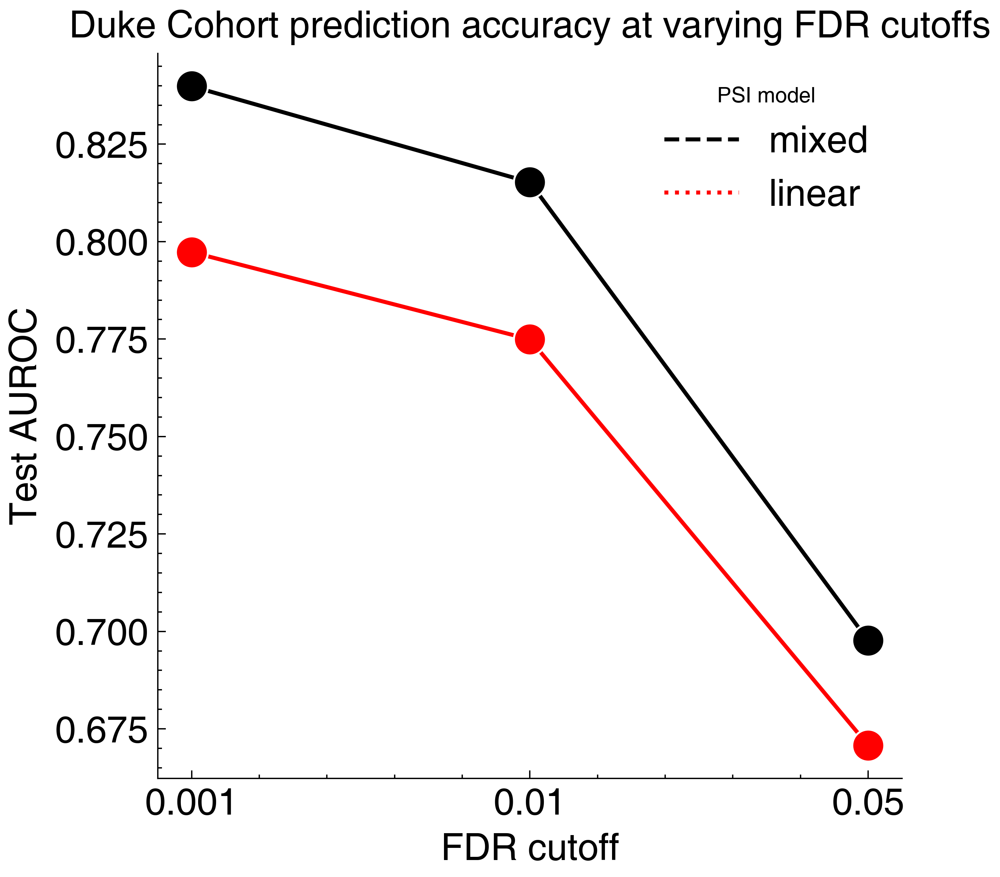

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.lineplot(x='FDR cutoff', y='Test AUROC', hue='PSI model', marker='o', ls='-', markersize=12, data=model_eval_df)
ax.set_title('Duke Cohort prediction accuracy at varying FDR cutoffs')
fig.savefig("%s/01-performance.pdf" % CLFDIR)

In [18]:
best_clf_id = model_eval_df.index[model_eval_df['Test AUROC'].argmax()]
duke_pred = duke_preds[best_clf_id]
best_clf = clfs[best_clf_id]
print("Best model = %s, AUC=%.3f" % (best_clf_id, model_eval_df['Test AUROC'].max()))

Best model = FirstExon0.001-FirstSamps, AUC=0.840


In [19]:
# get cv avg and std AUC for best model
feature_eids = {
    as_type:[ e 
        for e in sorted(metaloader.data[as_type].stats_tests)
        if metaloader.data[as_type].stats_tests[e].loc['final@First', 'qvals']<0.001
            ]
    for as_type in metaloader.data
}
train_conds = "final=='Control' or final=='First'"
feature_psi_df = get_psi_df(feature_eids, metaloader, use_jct=False, use_txr=True)
train_df = infect_train_df.query(train_conds)
X_train = feature_psi_df.loc[train_df.ID].to_numpy()
y_train = np.array([1 if train_df['final'][i]!='Control' else 0 for i in range(train_df.shape[0])])
cvx = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
scores = cross_val_score(best_clf, X_train, y_train, cv=cvx, n_jobs=1)
print('acc, mean=', np.mean(scores), 'std=', np.std(scores))
scores = cross_val_score(best_clf, X_train, y_train, scoring='roc_auc', cv=cvx, n_jobs=1)
print('auc, mean=', np.mean(scores), 'std=', np.std(scores))


acc, mean= 0.9020408163265307 std= 0.039572896795235346
auc, mean= 0.9216006402561024 std= 0.056927572372948244


In [20]:
best_train_df = train_dfs[best_clf_id]
best_train_df['cv_pred'] = train_stats[best_clf_id]['y_train.cv_pred'][:, 1]

ctrl_w_long = []
for pid in best_train_df.query('final=="Control"')['individual'].unique():
    this = best_train_df.query('final=="Control" and individual=="%s"' % pid)
    if this.shape[0] == 1:
        continue
    ctrl_w_long.append(pid)

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


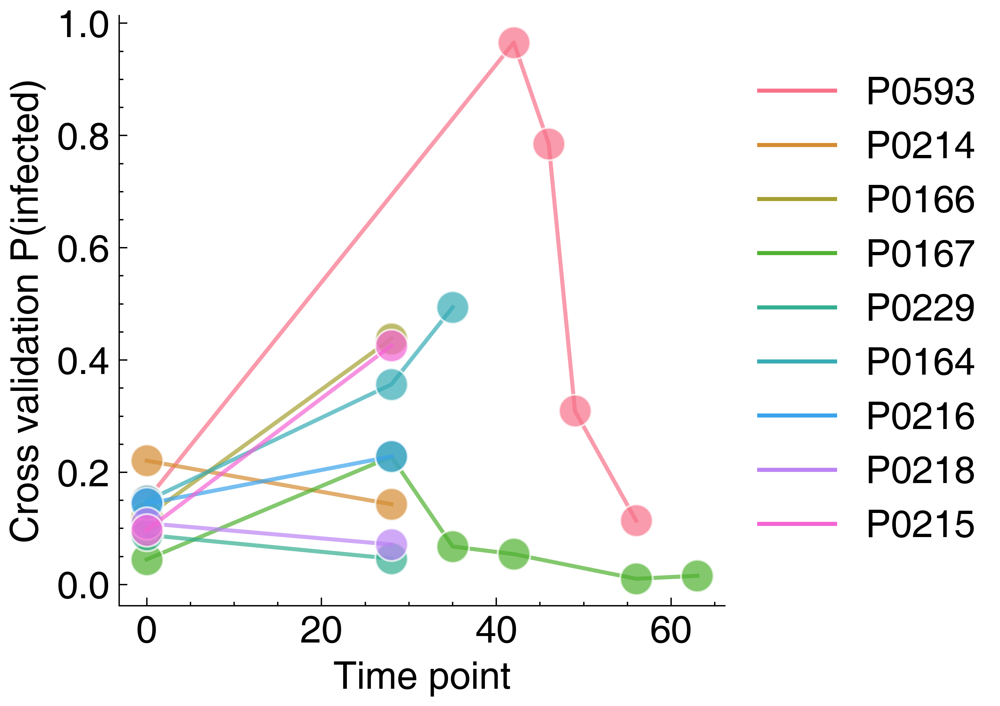

In [21]:
plot_df = best_train_df.loc[best_train_df['individual'].isin(ctrl_w_long)]
plot_df['individual'] = ['P%s'%x.split('_')[1] for x in plot_df['individual']]
fig, ax = plt.subplots(1,1, figsize=(4,4))
sns.lineplot(x='tp', y='cv_pred', hue='individual', marker='o', ls='-',
             markersize=12, data=plot_df, alpha=0.7,
             ax=ax)
ax.set_ylabel('Cross validation P(infected)')
ax.set_xlabel('Time point')
handles, labels = ax.get_legend_handles_labels()
for h in handles: h.set_linestyle("-")
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
fig.savefig('%s/02-train_cv_ctrl_long.pdf' % CLFDIR)

In [22]:
tp_df = {}
for pid in plot_df['individual'].unique():
    this = plot_df.query('individual == "%s"' % pid).sort_values('tp', ascending=True)
    tp_df[pid] = {
        'before_train': this.head(1)['cv_pred'].values[0],
        'amid_train_28': this.loc[this['tp']==28, 'cv_pred'].values[0] if (this['tp']==28).sum()>0 else np.nan,
        'after_train':  this.tail(1)['cv_pred'].values[0],
    }
    
ctrl_tp_df = pd.DataFrame(tp_df).transpose()
ctrl_tp_df['diff2'] = ctrl_tp_df['after_train'] - ctrl_tp_df['before_train']
ctrl_tp_df['diff1'] = ctrl_tp_df['amid_train_28'] - ctrl_tp_df['before_train']

ctrl_tp_df_ = ctrl_tp_df.append({'diff1': 1, 'diff2':1}, ignore_index=True)
ctrl_tp_df_ = ctrl_tp_df_.append({'diff1': -1, 'diff2':-1}, ignore_index=True)


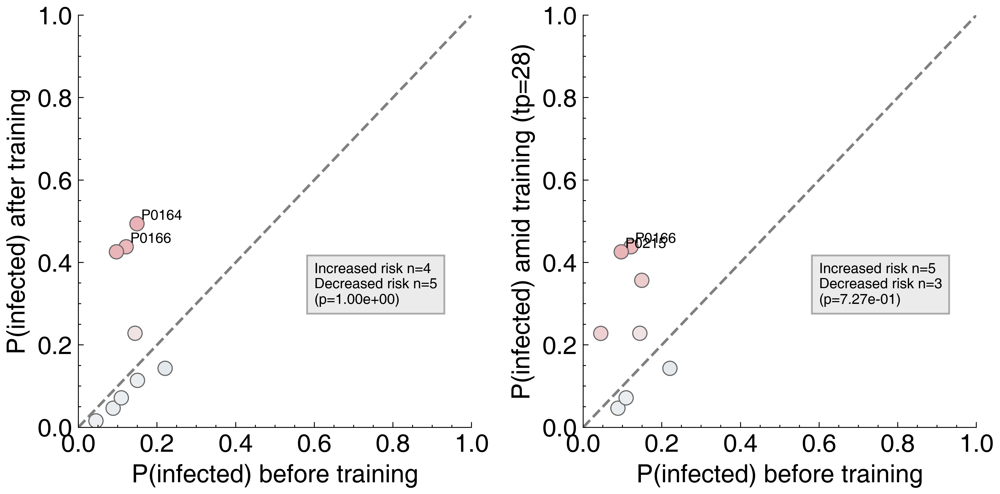

In [23]:
fig, axs = plt.subplots(1,2, figsize=(8,4))
axs[0].set_xlim(0,1)
axs[0].set_ylim(0,1)
axs[1].set_xlim(0,1)
axs[1].set_ylim(0,1)
axs[0].plot([0, 1], [0, 1], 
        transform=axs[0].transAxes, 
        color='grey', 
        ls='--')
axs[1].plot([0, 1], [0, 1], 
        transform=axs[1].transAxes, 
        color='grey', 
        ls='--')



cmap = sns.diverging_palette(240, 10, center='light', as_cmap=True)

sns.scatterplot(x='before_train', y='amid_train_28', hue='diff1',
                palette=cmap,
                edgecolor='dimgray',
                ax=axs[1],
                data=ctrl_tp_df_
               )
sns.scatterplot(x='before_train', y='after_train', hue='diff2',
                palette=cmap,
                edgecolor='dimgray',
                ax=axs[0],
                data=ctrl_tp_df_
               )
axs[0].legend().remove()
axs[1].legend().remove()

# add testing; need removing the NaN rows
ctrl_tp_df['abs_diff1'] = ctrl_tp_df['diff1'].abs()
ctrl_tp_df['abs_diff2'] = ctrl_tp_df['diff2'].abs()
n_inc = (ctrl_tp_df['diff1'] > 0).sum()
n_dec = (ctrl_tp_df['diff1'] <= 0).sum()
res = scipy.stats.binom_test(x=n_inc, n=n_inc+n_dec)
axs[1].text(0.6, 0.3,
        "Increased risk n=%i\nDecreased risk n=%i\n(p=%.2e)" % (n_inc, n_dec, res),
        bbox=dict(edgecolor='black', facecolor='silver', alpha=0.3)
       )

n_inc = (ctrl_tp_df['diff2'] > 0).sum()
n_dec = (ctrl_tp_df['diff2'] <= 0).sum()
res = scipy.stats.binom_test(x=n_inc, n=n_inc+n_dec)
axs[0].text(0.6, 0.3,
        "Increased risk n=%i\nDecreased risk n=%i\n(p=%.2e)" % (n_inc, n_dec, res),
        bbox=dict(edgecolor='black', facecolor='silver', alpha=0.3)
       )

axs[0].set_xlabel('P(infected) before training')
axs[0].set_ylabel('P(infected) after training')

axs[1].set_xlabel('P(infected) before training')
axs[1].set_ylabel('P(infected) amid training (tp=28)')

# label subjects
lab_df1 = ctrl_tp_df.sort_values(by='after_train', ascending=False).head(2)
lab_df2 = ctrl_tp_df.sort_values(by='amid_train_28', ascending=False).head(2)
for subj in lab_df1.index:
    axs[0].text(lab_df1.loc[subj, 'before_train']+0.01, lab_df1.loc[subj, 'after_train']+0.01, subj)

for subj in lab_df2.index:
    axs[1].text(lab_df2.loc[subj, 'before_train']+0.01, lab_df2.loc[subj, 'amid_train_28']+0.01, subj)



fig.tight_layout()
fig.savefig('%s/02-train_cv_ctrl_scatter.pdf' % CLFDIR)

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


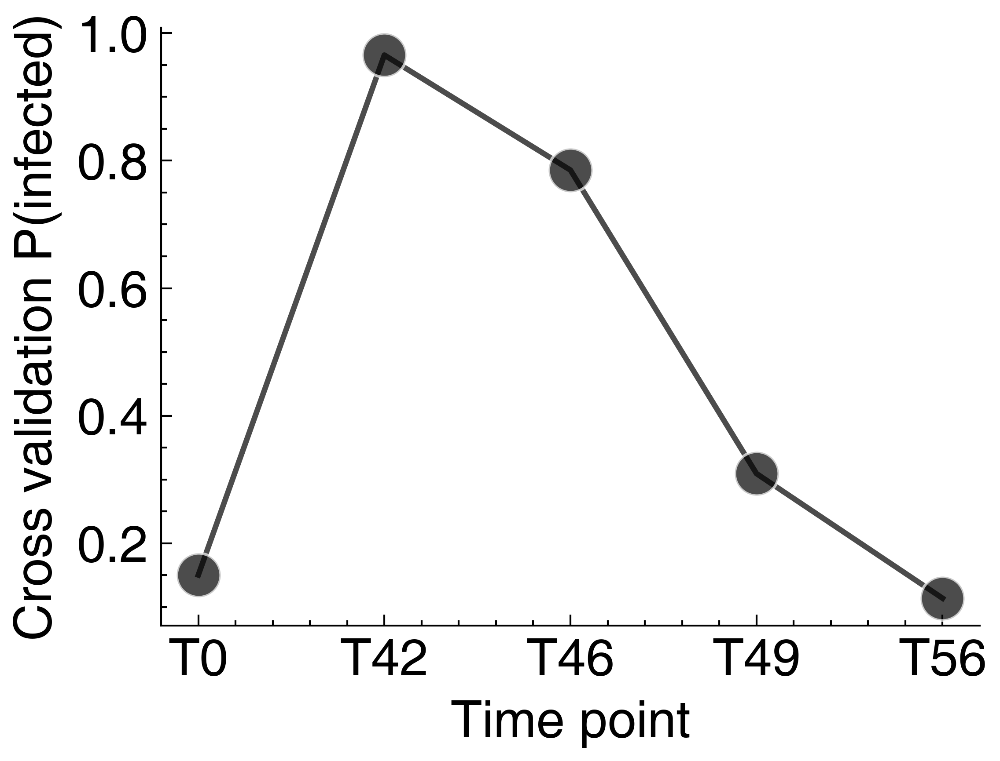

In [24]:
plot_df = best_train_df.loc[best_train_df['individual']=='P20_0593']
plot_df['individual'] = ['P%s'%x.split('_')[1] for x in plot_df['individual']]
plot_df['tp'] = ['T%i'%i for i in plot_df['tp']]
fig, ax = plt.subplots(1,1, figsize=(4,3))
sns.lineplot(x='tp', y='cv_pred', hue='individual', marker='o', ls='-',
             #order=['T0', 'T42', 'T46', 'T49', 'T56'],
             markersize=12, data=plot_df, alpha=0.7,
             ax=ax)
ax.set_ylabel('Cross validation P(infected)')
ax.set_xlabel('Time point')
handles, labels = ax.get_legend_handles_labels()
for h in handles: h.set_linestyle("-")
#ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend().remove()
fig.savefig('%s/02-train_cv_ctrl_P0593.pdf' % CLFDIR)

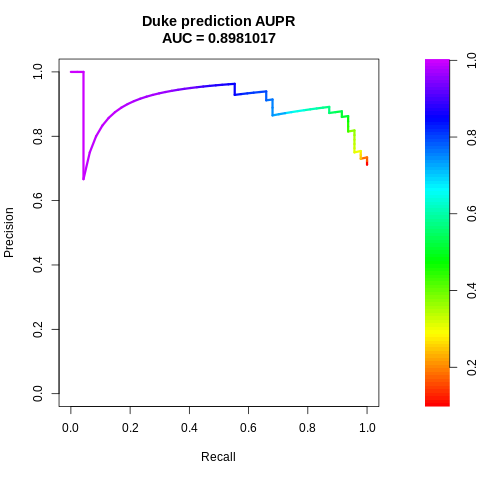

In [25]:
%%R -i duke_y -i duke_pred -i CLFDIR
library(PRROC)
pr = pr.curve(as.vector(duke_pred[duke_y==1]), as.vector(duke_pred[duke_y==0]), curve=T)
pdf(file.path(CLFDIR, "02-test_aupr.pdf"), width=5, height=5)
plot(pr, main='Duke prediction AUPR')
dev.off()
plot(pr, main='Duke prediction AUPR')

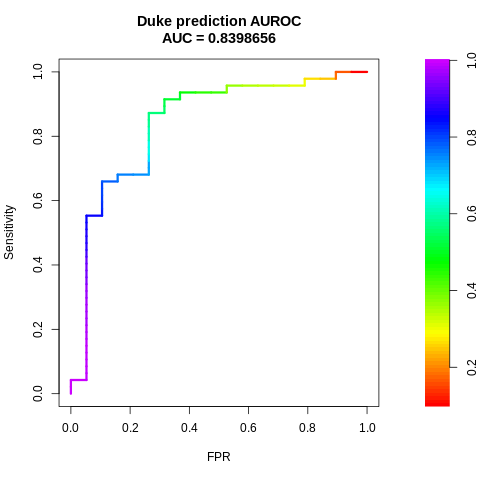

In [26]:
%%R
pdf(file.path(CLFDIR, "02-test_auroc.pdf"), width=5, height=5)
roc = roc.curve(as.vector(duke_pred[duke_y==1]), as.vector(duke_pred[duke_y==0]), curve=T)
plot(roc, main='Duke prediction AUROC')
dev.off()
plot(roc, main='Duke prediction AUROC')

In [27]:
print(duke_y)
duke_pred.round(2)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


array([0.98, 0.88, 0.99, 0.87, 0.77, 0.88, 0.97, 0.65, 0.93, 0.94, 0.58,
       0.61, 0.8 , 0.73, 0.3 , 0.8 , 0.19, 0.37, 0.94, 0.98, 0.53, 0.72,
       0.81, 0.97, 0.97, 0.93, 0.81, 0.61, 0.51, 0.87, 0.98, 0.99, 0.64,
       0.69, 1.  , 0.85, 0.9 , 0.99, 0.55, 0.83, 1.  , 0.97, 0.57, 0.96,
       0.99, 0.99, 0.99, 0.48, 0.33, 0.43, 0.24, 0.99, 0.51, 0.75, 0.26,
       0.45, 0.75, 0.35, 0.56, 0.36, 0.31, 0.85, 0.1 , 0.78, 0.17, 0.33])

Text(0.5, 0, 'Sex')

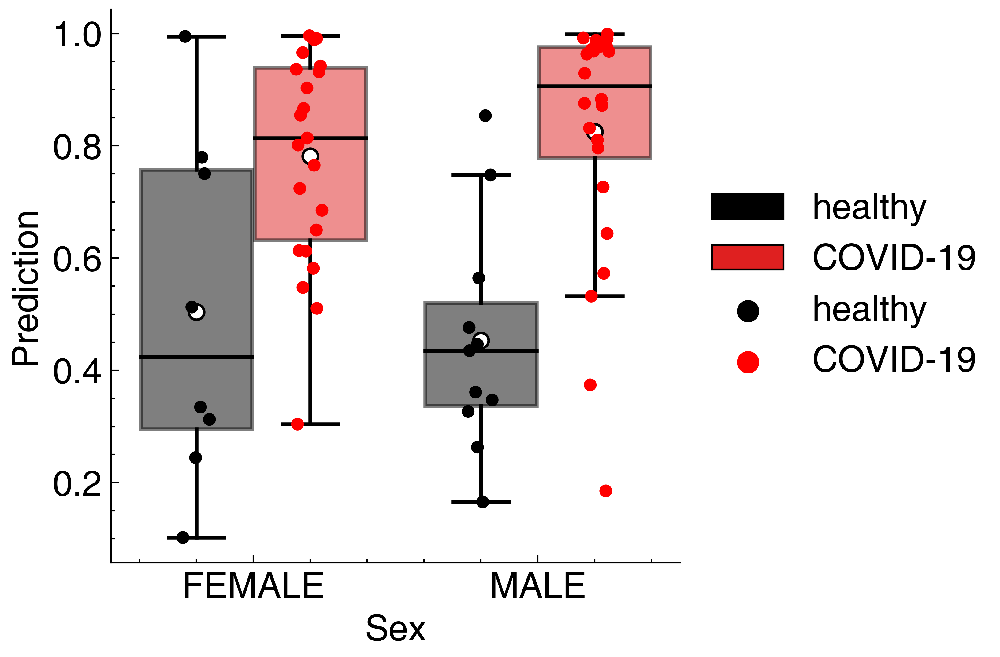

In [28]:
duke_pred_df = pd.concat(
    [pd.Series(data=duke_preds[x], index=duke_metaloader.data['SE'].covariates.covariate.index, name=x) 
     for x in duke_preds] + 
     [duke_metaloader.data['SE'].covariates.meta.loc[duke_metaloader.data['SE'].covariates.covariate.index]],
    axis=1)

fig, ax = plt.subplots(1,1, figsize=(4,4))
sns.boxplot(y=best_clf_id, x='gender', 
            hue='Pathogen', 
            order=['FEMALE', 'MALE'],
            hue_order=['healthy', 'COVID-19'],
            showmeans=True, meanprops={"marker": 'o', "markerfacecolor":"white", "markeredgecolor": "black"},
            showfliers=False, boxprops=dict(alpha=0.5),
            ax=ax,
            data=duke_pred_df)
sns.stripplot(y=best_clf_id, x='gender',
              hue='Pathogen', 
              order=['FEMALE', 'MALE'],
              hue_order=['healthy', 'COVID-19'],
              data=duke_pred_df, ax=ax, dodge=True, edgecolor='black')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_ylabel('Prediction')
ax.set_xlabel('Sex')

In [29]:
# FEMALE
for x in duke_preds:
    subdf = duke_pred_df.query('gender=="FEMALE"')
    if not x in subdf:
        continue
    print(x, roc_auc_score(subdf['Pathogen'], 1-subdf[x]))

FirstExon0.001-FirstSamps 0.7554347826086957
FirstExon0.01-FirstSamps 0.8260869565217392
FirstExon0.05-FirstSamps 0.657608695652174
FirstExon0.001-FirstSamps-LM 0.7336956521739131
FirstExon0.01-FirstSamps-LM 0.7282608695652175
FirstExon0.05-FirstSamps-LM 0.6684782608695652


In [30]:
# MALE
for x in duke_preds:
    subdf = duke_pred_df.query('gender=="MALE"')
    if not x in subdf:
        continue
    print(x, roc_auc_score(subdf['Pathogen'], 1-subdf[x]))

FirstExon0.001-FirstSamps 0.893939393939394
FirstExon0.01-FirstSamps 0.821969696969697
FirstExon0.05-FirstSamps 0.7424242424242424
FirstExon0.001-FirstSamps-LM 0.8409090909090909
FirstExon0.01-FirstSamps-LM 0.803030303030303
FirstExon0.05-FirstSamps-LM 0.6856060606060607


In [31]:
# TOTAL
for x in duke_preds:
    subdf = duke_pred_df
    if not x in subdf:
        continue
    print(x, roc_auc_score(subdf['Pathogen'], 1-subdf[x]))

FirstExon0.001-FirstSamps 0.8398656215005599
FirstExon0.01-FirstSamps 0.8152295632698768
FirstExon0.05-FirstSamps 0.6976483762597985
FirstExon0.001-FirstSamps-LM 0.7973124300111981
FirstExon0.01-FirstSamps-LM 0.77491601343785
FirstExon0.05-FirstSamps-LM 0.6707726763717805


In [32]:
duke_pred_df.query('Pathogen=="COVID-19"')[['gender', 'age_at_enroll', 'days_since_onset']].groupby('gender').agg('mean')

,age_at_enroll,days_since_onset
gender,,
FEMALE,46.373913,15.739130
MALE,45.770833,12.833333


In [33]:
print('total auc=', roc_auc_score(duke_pred_df['Pathogen'], 1-duke_pred_df[best_clf_id]))

print('female auc=', roc_auc_score(duke_pred_df.query('gender=="FEMALE"')['Pathogen'], 1-duke_pred_df.query('gender=="FEMALE"')[best_clf_id]))
print('male auc=', roc_auc_score(duke_pred_df.query('gender=="MALE"')['Pathogen'], 1-duke_pred_df.query('gender=="MALE"')[best_clf_id]))

total auc= 0.8398656215005599
female auc= 0.7554347826086957
male auc= 0.893939393939394


In [34]:
def plot_eid_btw_duke_and_charm(eid, feature_psi_df, duke_psi_df, ax=None, do_plot=True):
    #print(eid)
    navy_first = feature_psi_df[[eid]].copy()
    navy_first.at[navy_first.index.isin(covs.meta.index[covs.meta.final.isin(['Control'])]), 'COVID'] = 'Control'
    navy_first.at[navy_first.index.isin(covs.meta.index[covs.meta.final.isin(['First'])]), 'COVID'] = 'COVID'
    navy_first['Cohort'] = 'Charm'
    duke_plot_df = duke_psi_df[[eid]].copy()
    duke_plot_df['COVID'] = duke_y
    duke_plot_df.at[duke_y==1, 'COVID'] = 'COVID'
    duke_plot_df.at[duke_y==0, 'COVID'] = 'Control'

    duke_plot_df['Cohort'] = 'Duke'

    duke_plot_df = navy_first.append(duke_plot_df)
    genename = metaloader._reg_tables[eid.split(':')[1]].loc[ ':'.join(eid.split(':')[2:]),  'geneSymbol' ]
    if do_plot is True:
        if ax is None:
            fig, ax = plt.subplots(1,1, figsize=(5,4))
        ax = sns.boxplot(x='Cohort', y=eid, hue='COVID', data=duke_plot_df, ax=ax, showfliers=False, boxprops=dict(alpha=0.5))
        sns.stripplot(x='Cohort', y=eid, hue='COVID', data=duke_plot_df, ax=ax, dodge=True, edgecolor='black')
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.set_ylabel('')
        ax.set_title( ':'.join(eid.split(':')[2:]))
        fig.suptitle("%s, %s" % (
            genename,
            eid.split(':')[1]
        )
        )
        #fig.tight_layout()
    avg_psi = {}
    avg_psi['charm.ctrl'] = duke_plot_df.query('Cohort=="Charm" and COVID=="Control"')[eid].mean()
    avg_psi['charm.covid'] = duke_plot_df.query('Cohort=="Charm" and COVID!="Control"')[eid].mean()
    avg_psi['duke.ctrl'] = duke_plot_df.query('Cohort=="Duke" and COVID=="Control"')[eid].mean()
    avg_psi['duke.covid'] = duke_plot_df.query('Cohort=="Duke" and COVID!="Control"')[eid].mean()
    return ax, genename, avg_psi

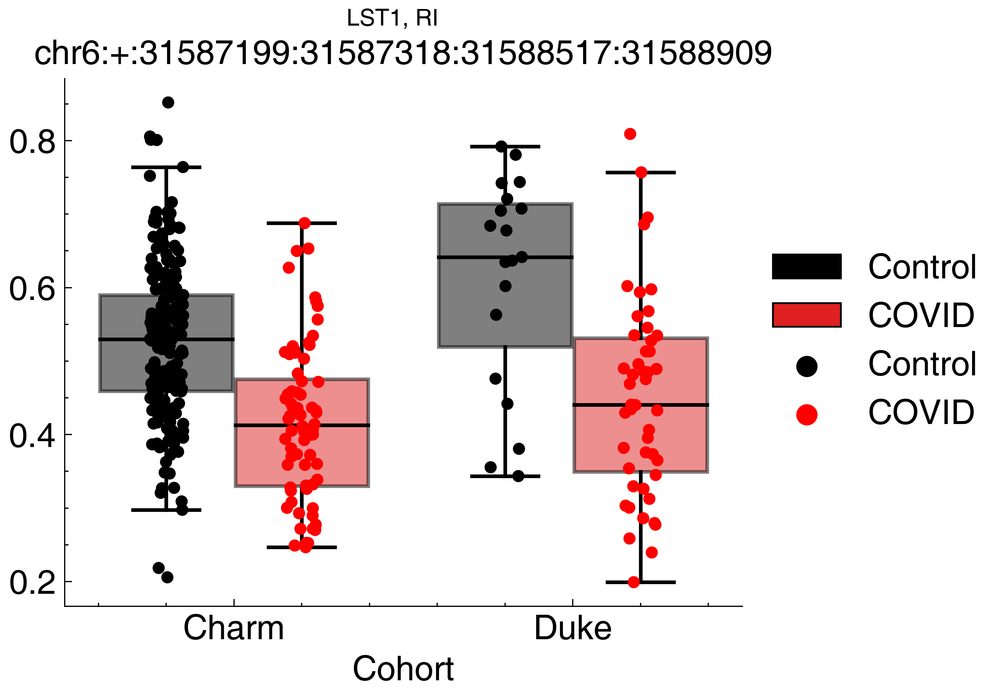

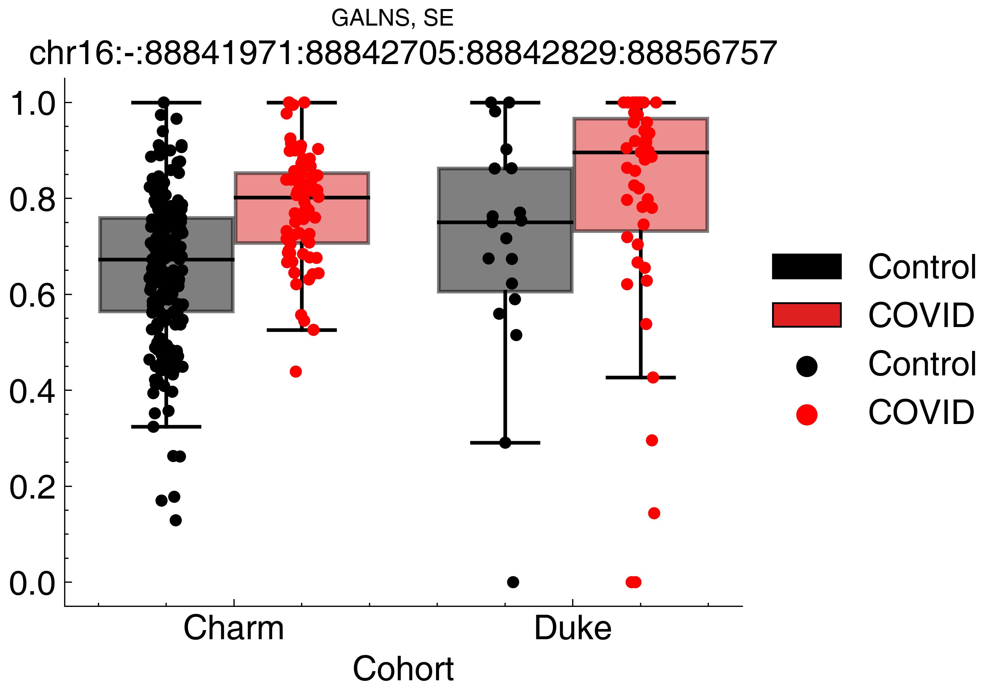

In [35]:
best_train_stats = train_stats[best_clf_id]
best_coefs_abs = best_train_stats['clf.coef'].abs()
feature_psi_df = train_psi_dfs[best_clf_id]
duke_psi_df = duke_psi_dfs[best_clf_id]

eids = [
    'txr:RI:chr6:+:31587199:31587318:31588517:31588909',
    #'txr:SE:chr16:-:16219947:16220272:16220388:16221648'
    'txr:SE:chr16:-:88841971:88842705:88842829:88856757'
]
for eid in eids:
    #eid = best_coefs_abs.sort_values(ascending=False).index[i]
    ax, genename, _ = plot_eid_btw_duke_and_charm(eid, feature_psi_df, duke_psi_df)
    plt.savefig("%s/03-duke_cohort_%s.pdf"%(CLFDIR, genename))
    plt.show()


In [36]:
# write out all consistent events
best_coefs_abs_ = best_train_stats['clf.coef'].abs().sort_values(ascending=False)
best_coefs = best_train_stats['clf.coef']
cross_cohort_evts = pd.DataFrame(columns=['event_id', 'event_type', 'genename', 'importance', 'charm.ctrl',
                                         'charm.covid',
                                          'duke.ctrl', 'duke.covid'
                                         ])

for eid in best_coefs_abs_.index:
    _, genename, avg_psi = plot_eid_btw_duke_and_charm(eid, feature_psi_df, duke_psi_df, do_plot=False)
    this = {
            'event_id': ":".join(eid.split(':')[2:]),
            'event_type': eid.split(':')[1],
            'genename': genename,
            'importance': best_coefs[eid],
        }
    this.update(avg_psi)
    cross_cohort_evts = cross_cohort_evts.append(
        this, ignore_index=True
    )

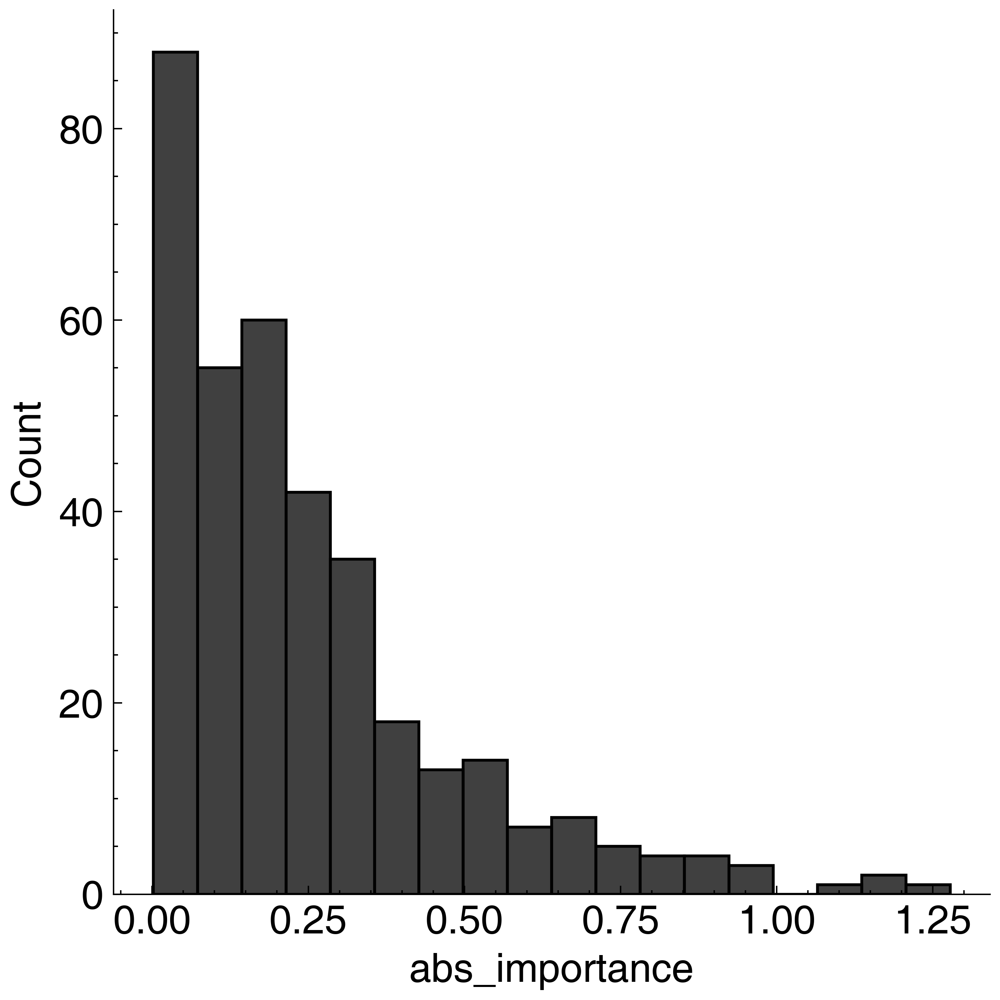

In [37]:
cross_cohort_evts['abs_importance'] = cross_cohort_evts['importance'].abs()
cross_cohort_evts['charm.delta'] = cross_cohort_evts['charm.covid'] - cross_cohort_evts['charm.ctrl']
cross_cohort_evts['duke.delta'] = cross_cohort_evts['duke.covid'] - cross_cohort_evts['duke.ctrl']
cross_cohort_evts['is_consistent'] = np.sign(cross_cohort_evts['charm.delta'] * 
    cross_cohort_evts['duke.delta'] )
cross_cohort_evts = cross_cohort_evts.dropna()
sns.displot(x='abs_importance', data=cross_cohort_evts)

In [38]:
cross_cohort_evts_1pct = cross_cohort_evts.loc[(cross_cohort_evts['charm.delta'].abs()>0.01) & (cross_cohort_evts['is_consistent']==1)]
cross_cohort_evts_1pct.rename(columns={
    'charm.ctrl': 'Charm control PSI',
    'charm.covid': 'Charm covid PSI',
    'duke.ctrl': 'Duke control PSI',
    'duke.covid': 'Duke covid PSI',
    'charm.delta': 'Charm delta PSI',
    'duke.delta': 'Duke delta PSI',
}, inplace=True)
cross_cohort_evts_1pct.drop(columns=['is_consistent', 'abs_importance'], inplace=True)
cross_cohort_evts_1pct.to_csv('%s/das_classifier/06-cross_cohort_evts_1pct.tsv' % DATA_VER, index=False, sep="\t")
cross_cohort_evts_1pct

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,event_id,event_type,genename,importance,Charm control PSI,Charm covid PSI,Duke control PSI,Duke covid PSI,Charm delta PSI,Duke delta PSI
0,chr22:+:22888259:22893699:22893818:22895374,SE,IGLL5,1.277853,0.744223,0.810055,0.870451,0.907653,0.065831,0.037201
1,chr6:+:31587199:31587318:31588517:31588909,RI,LST1,-1.174399,0.526504,0.479971,0.612048,0.451003,-0.046533,-0.161045
2,chr16:-:88841971:88842705:88842829:88856757,SE,GALNS,1.166554,0.654107,0.697571,0.699463,0.797454,0.043464,0.097991
3,chr13:-:42917624:42919299:42919332:42926335,SE,EPSTI1,1.115809,0.410087,0.475345,0.515139,0.598682,0.065258,0.083543
4,chr16:-:16219947:16220272:16220388:16221648,SE,ABCC6,-0.953199,0.732908,0.659868,0.664114,0.534855,-0.073040,-0.129259
...,...,...,...,...,...,...,...,...,...,...
333,chr14:-:94388663:94388800:94389010:94390456,SE,SERPINA1,-0.020159,0.489709,0.506599,0.452662,0.491341,0.016890,0.038678
342,chr16:-:31201841:31202146:31202203:31202416,SE,PYCARD,-0.013461,0.907374,0.892486,0.899671,0.889576,-0.014888,-0.010095
347,chr9:+:93110567:93110721:93112217:93112289,RI,CARD19,-0.011871,0.570095,0.556699,0.510929,0.453469,-0.013396,-0.057460
353,chr19:+:13075671:13078612:13078735:13081679,SE,NFIX,0.006748,0.809529,0.752519,0.753084,0.696551,-0.057011,-0.056532


## DETOUR: check CD45 as identified in Notebook 12 and 11

In [39]:
duke_male_covid = duke_metaloader. \
    data['SE']. \
    junction_measure.loc[
        'chr1:+:198699704:198702386:198702530:198703297', 
        duke_metaloader.data['SE'].covariates.covariate.query('`Pathogen@healthy`==0 and `gender@MALE`==1').index
].apply(lambda x: x.psi)

duke_male_ctrl = duke_metaloader. \
    data['SE']. \
    junction_measure.loc[
        'chr1:+:198699704:198702386:198702530:198703297', 
        duke_metaloader.data['SE'].covariates.covariate.query('`Pathogen@healthy`==1 and `gender@MALE`==1').index
].apply(lambda x: x.psi)

In [40]:
duke_female_covid = duke_metaloader. \
    data['SE']. \
    junction_measure.loc[
        'chr1:+:198699704:198702386:198702530:198703297', 
        duke_metaloader.data['SE'].covariates.covariate.query('`Pathogen@healthy`==0 and `gender@MALE`==0').index
].apply(lambda x: x.psi)

duke_female_ctrl = duke_metaloader. \
    data['SE']. \
    junction_measure.loc[
        'chr1:+:198699704:198702386:198702530:198703297', 
        duke_metaloader.data['SE'].covariates.covariate.query('`Pathogen@healthy`==1 and `gender@MALE`==0').index
].apply(lambda x: x.psi)

In [41]:
print(duke_male_ctrl.mean())
print(duke_male_covid.mean())
print(duke_female_ctrl.mean())
print(duke_female_covid.mean())

0.42234597174786614
0.3683911920635739
0.4802131180716021
0.3537119693745265


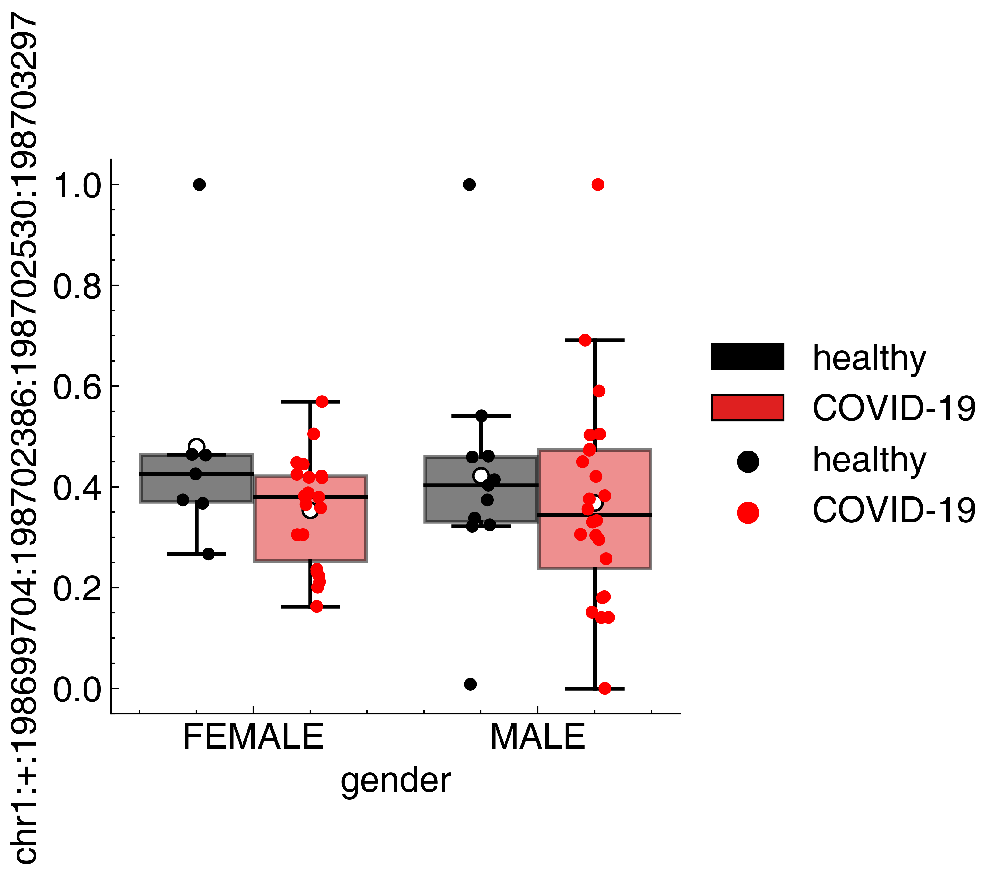

In [42]:
duke_cd45 = pd.concat(
    [duke_metaloader.data['SE'].junction_measure.loc[
        'chr1:+:198699704:198702386:198702530:198703297', 
        duke_metaloader.data['SE'].covariates.covariate.index].apply(lambda x: x.psi), 
     duke_metaloader.data['SE'].covariates.meta], axis=1)

fig, ax = plt.subplots(1,1, figsize=(4,4))
sns.boxplot(y='chr1:+:198699704:198702386:198702530:198703297', x='gender', 
            hue='Pathogen', 
            order=['FEMALE', 'MALE'],
            hue_order=['healthy', 'COVID-19'],
            showmeans=True, meanprops={"marker": 'o', "markerfacecolor":"white", "markeredgecolor": "black"},
            showfliers=False, boxprops=dict(alpha=0.5),
            ax=ax,
            data=duke_cd45)
sns.stripplot(y='chr1:+:198699704:198702386:198702530:198703297', x='gender',
              hue='Pathogen', 
              order=['FEMALE', 'MALE'],
              hue_order=['healthy', 'COVID-19'],
              data=duke_cd45, ax=ax, dodge=True, edgecolor='black')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## 5. Application to Pre sample classifications

In [43]:
pre_train_df = pre_df.loc[pre_df['final'].isin(['Control', 'Pre'])]

first_psi_df = feature_psi_df
X_test = first_psi_df.loc[pre_train_df.ID].to_numpy()
y_test = np.array([0 if pre_train_df['final'][i]=='Control' else 1 for i in range(pre_train_df.shape[0])])
pred_test = best_clf.predict_proba(X_test)[:, 1]
pre_train_df.at[:, 'first_clf_pred'] = pred_test

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [44]:
pre_date = {a[0]:a[1].query('final=="Pre"')['tp'].max() for a in pre_train_df.groupby('individual')}
pre_train_df['pre_tp'] = 0
for i in pre_train_df.index:
    pre_train_df.at[i, 'pre_tp'] = pre_train_df.loc[i, 'tp'] - pre_date[pre_train_df.loc[i, 'individual']]

pre_train_df['pre_tp'].clip(-28, 56, inplace=True)
pre_train_df.head()

/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/mnt/home/zzhang/anaconda3/envs/rna-seq/lib/python3.6/site-packages/pandas/core/generic.py:7352: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)


,ID,final,Sex,individual,tp,first_clf_pred,pre_tp
ID,,,,,,,
20_0233-T28,20_0233-T28,Pre,M,P20_0233,28,0.133161,0
20_0255-T00,20_0255-T00,Control,F,P20_0255,0,0.161870,-28
20_1575-T00,20_1575-T00,Pre,M,P20_1575,0,0.567446,0
20_0207-T10,20_0207-T10,Control,M,P20_0207,10,0.483915,-18
20_0228-T28,20_0228-T28,Pre,M,P20_0228,28,0.211487,0


In [45]:
pid_avg_ctrl = {}
pid_avg_pre = {}
for pid in pre_train_df['individual'].unique():
    pid_df = pre_train_df[pre_train_df['individual']==pid]
    pid_avg_ctrl[pid] = pid_df.query('pre_tp!=0')['first_clf_pred'].mean()
    pid_avg_pre[pid] = pid_df.query('pre_tp==0')['first_clf_pred'].mean()


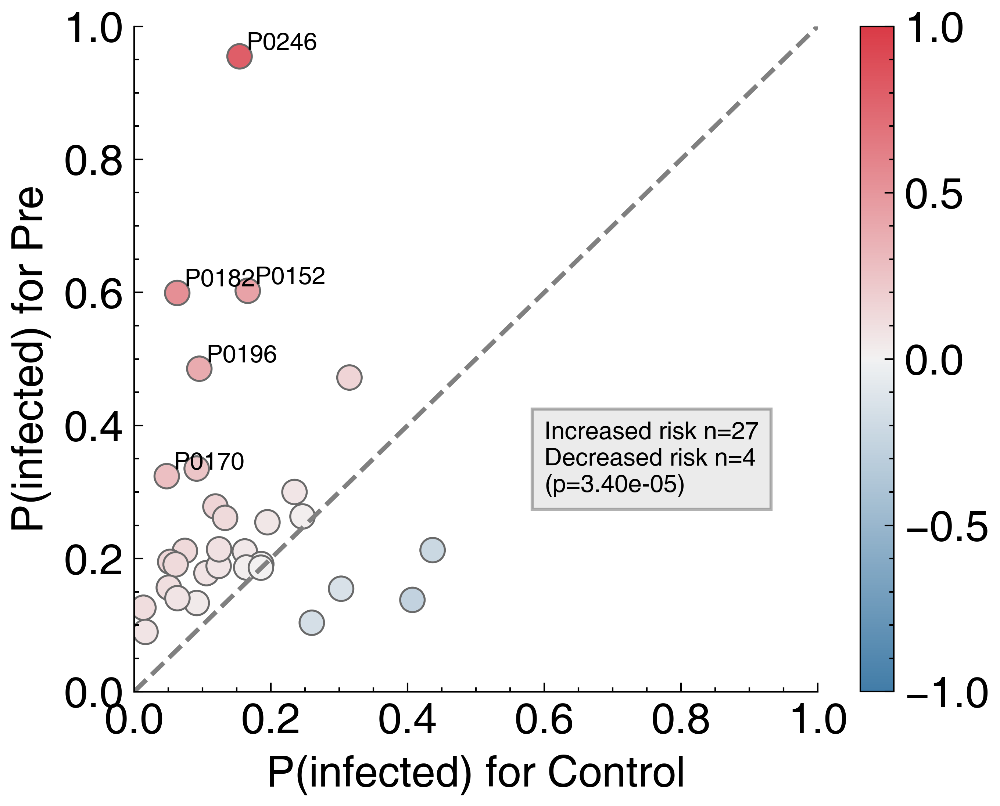

In [46]:
pid_df = pd.DataFrame([pid_avg_ctrl, pid_avg_pre], index=['Control', 'Pre']).transpose()
pid_df['pid'] = pid_df.index
pid_df['diff'] = pid_df['Pre'] - pid_df['Control']
pid_df['abs_diff'] = pid_df['diff'].abs()
# label subjects
lab_df = pid_df.sort_values(by='abs_diff', ascending=False).head(5)


# this is so lame to center the cmap...
pid_df = pid_df.append({'diff': 1}, ignore_index=True)
pid_df = pid_df.append({'diff': -1}, ignore_index=True)
fig, ax = plt.subplots(1,1, figsize=(5,4))
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.plot([0, 1], [0, 1], 
        transform=ax.transAxes, 
        color='grey', 
        ls='--')
cmap = sns.diverging_palette(240, 10, center='light', as_cmap=True)
sns.scatterplot(x='Control', y='Pre', hue='diff',
                palette=cmap,
                edgecolor='dimgray',
                data=pid_df,
                ax=ax
               )

norm = plt.Normalize(-1, 1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

ax.legend().remove()
ax.figure.colorbar(sm)
ax.set_xlabel('P(infected) for Control')
ax.set_ylabel('P(infected) for Pre')

for subj in lab_df.index:
    subj_ = 'P' + subj.split('_')[1]
    ax.text(lab_df.loc[subj, 'Control']+0.01, lab_df.loc[subj, 'Pre']+0.01, subj_)

# add testing; need removing the NaN rows
pid_df_ = pid_df.dropna()
n_inc = (pid_df_['diff'] > 0).sum()
n_dec = (pid_df_['diff'] <= 0).sum()
res = scipy.stats.binom_test(x=n_inc, n=n_inc+n_dec)
ax.text(0.6, 0.3,
        "Increased risk n=%i\nDecreased risk n=%i\n(p=%.2e)" % (n_inc, n_dec, res),
        bbox=dict(edgecolor='black', facecolor='silver', alpha=0.3)
       )
plt.savefig("%s/04-charm_cohort_pre-1.pdf" % CLFDIR)

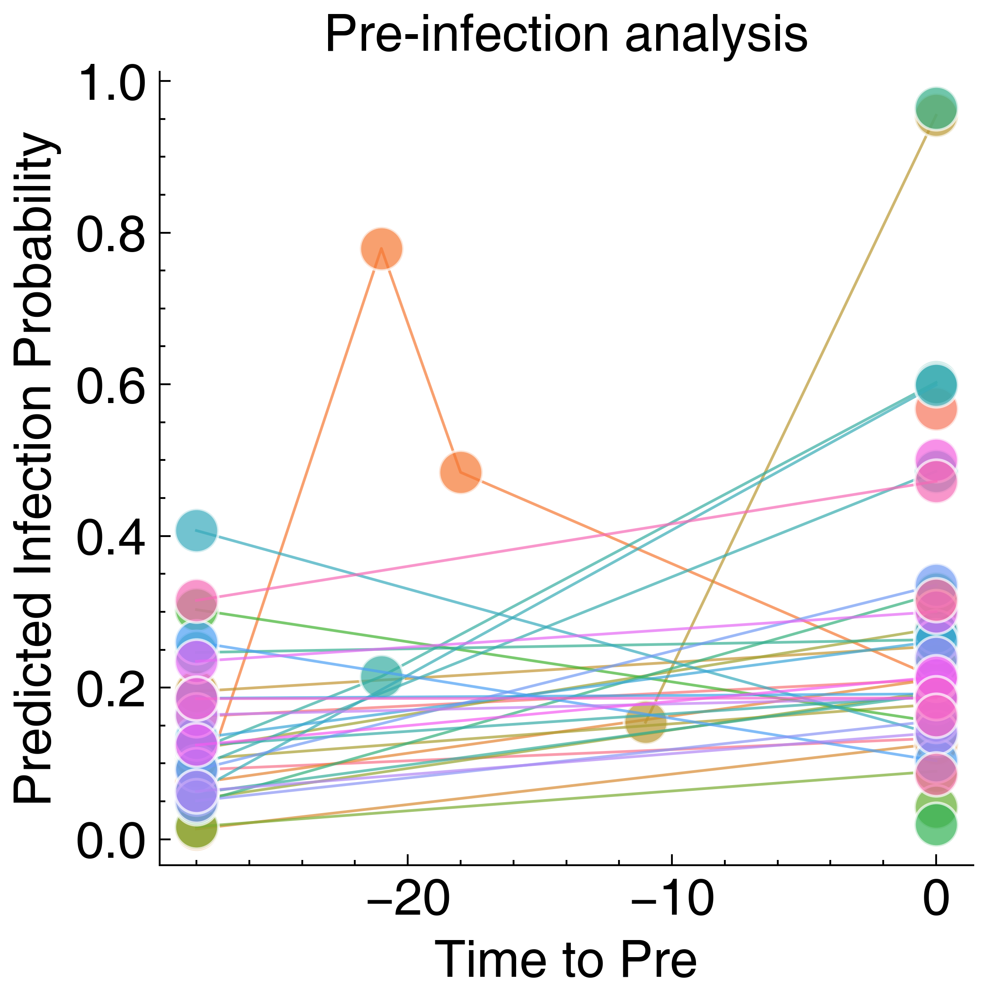

In [47]:
fig, ax = plt.subplots(1,1, figsize=(4,4))
sns.lineplot(x='pre_tp', y='first_clf_pred', hue='individual', marker='o', ls='-', size=1, 
             markersize=12, data=pre_train_df, alpha=0.7, ax=ax)
#ax.axhline(0.5, linestyle='--', color='black')
ax.legend().remove()
ax.set_ylabel('Predicted Infection Probability')
ax.set_xlabel('Time to Pre')
ax.set_title('Pre-infection analysis')
fig.savefig("%s/04-charm_cohort_pre.pdf" % CLFDIR)

In [48]:
pre_train_df.sort_values('first_clf_pred', ascending=False).to_csv('%s/das_classifier/pre_prediction.tsv' % DATA_VER, sep="\t")

Average precision-recall score: 0.76


Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.76')

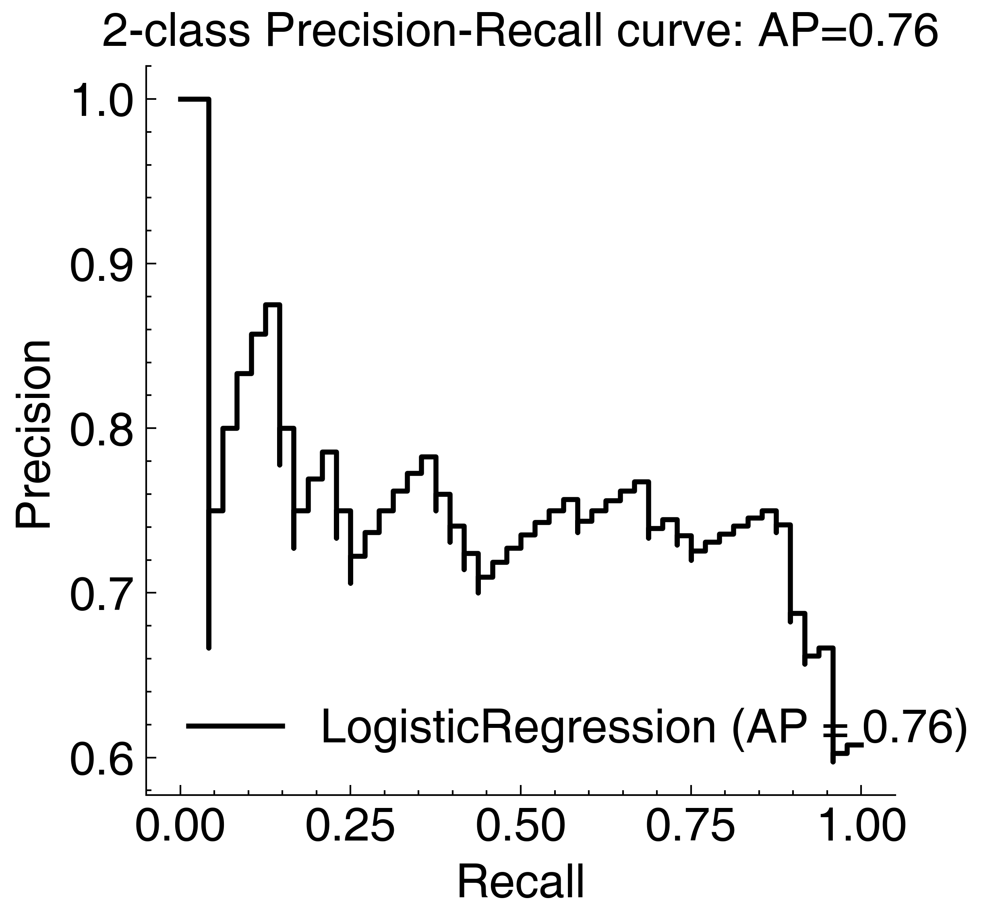

In [49]:
average_precision = average_precision_score(y_test, pred_test)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))
fig, ax = plt.subplots(1,1,figsize=(4,4))
disp = plot_precision_recall_curve(best_clf, X_test, y_test, ax=ax)
disp.ax_.set_title('2-class Precision-Recall curve: '
                   'AP={0:0.2f}'.format(average_precision))

In [50]:
pre_train_df.query('final=="Pre"') \
.sort_values('first_clf_pred', ascending=False) \
.to_csv('./%s/pre_clf_pred.tsv' % DATA_VER, index=False, sep="\t")    


## 5. Feature importance and example plot

In [51]:
ctrl_misclassified_indvs = pre_train_df.loc[
    (pre_train_df['final']=='Control') & (pre_train_df['first_clf_pred']>0.75), 'individual']
misclassified_df = pre_train_df.loc[pre_train_df['individual'].isin(ctrl_misclassified_indvs)].join(
    covs.meta[['IgG_call', 'IgM_call']]
)
misclassified_df['IgG_or_IgM'] = ['Pos' if misclassified_df.loc[i, 'IgG_call']=='Pos' or \
                                  misclassified_df.loc[i, 'IgM_call']=='Pos' else 'Neg' for
                                  i in misclassified_df.index
                                 ]
misclassified_df

,ID,final,Sex,individual,tp,first_clf_pred,pre_tp,IgG_call,IgM_call,IgG_or_IgM
ID,,,,,,,,,,
20_0207-T10,20_0207-T10,Control,M,P20_0207,10,0.483915,-18,Unknown,Unknown,Neg
20_0207-T00,20_0207-T00,Control,M,P20_0207,0,0.046839,-28,Neg,Neg,Neg
20_0207-T07,20_0207-T07,Control,M,P20_0207,7,0.779137,-21,Neg,Neg,Neg
20_0207-T28,20_0207-T28,Pre,M,P20_0207,28,0.212670,0,Neg,Neg,Neg


In [52]:
fem_wrong = misclassified_df.loc[(misclassified_df.Sex=='F'), 'individual'].unique()
mal_wrong = misclassified_df.loc[(misclassified_df.Sex=='M'), 'individual'].unique()
fem_tot = pre_train_df.query('Sex=="F" & final=="Control"')['individual'].unique()
mal_tot = pre_train_df.query('Sex=="M" & final=="Control"')['individual'].unique()

from scipy.stats import fisher_exact
from statsmodels.stats.contingency_tables import mcnemar
count_table = np.array([ 
    [fem_wrong.size, fem_tot.size-fem_wrong.size], 
    [mal_wrong.size, mal_tot.size-mal_wrong.size] 
])
print(count_table)
print(fisher_exact(count_table, alternative='less'))
#print(mcnemar(count_table))
pd.DataFrame(count_table, index=['female', 'male'], columns=['wrong', 'correct'])


[[ 0 11]
 [ 1 18]]
(0.0, 0.6333333333333329)


,wrong,correct
female,0,11
male,1,18


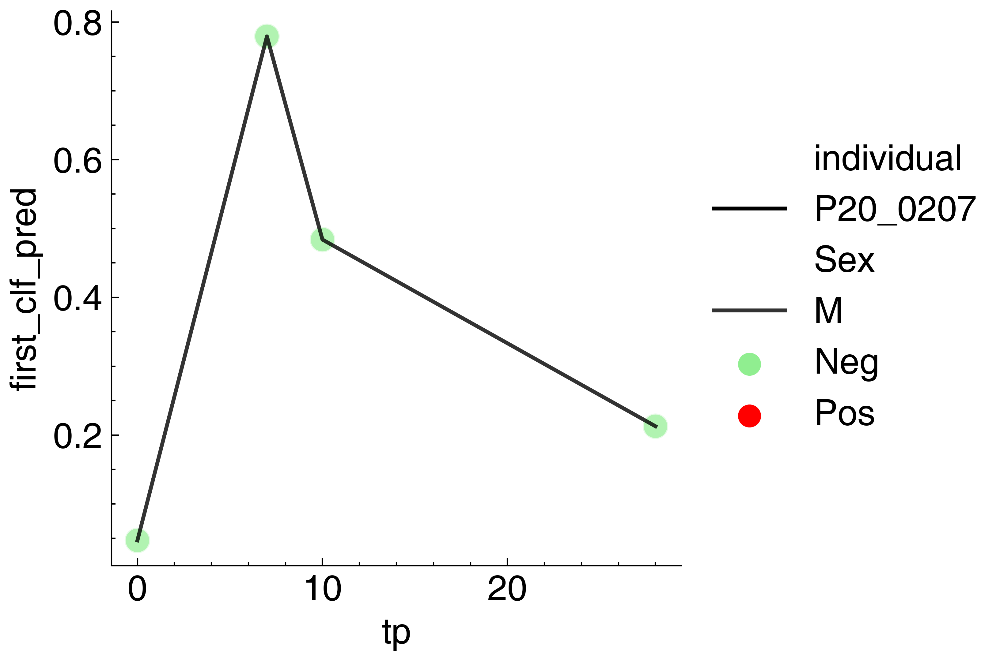

In [53]:
# THIS INDIVIDUAL P0207 had an error in labelling of times; it should be 
# T04 to T39
# T07 to T42
# T10 to T46
fig, ax = plt.subplots(1,1, figsize=(4,4))
sns.lineplot(x='tp', y='first_clf_pred', alpha=0.8, hue='individual', style='Sex', data=misclassified_df, ax=ax)
sns.scatterplot(x='tp', y='first_clf_pred', hue='IgG_or_IgM', alpha=0.7, s=100, 
                palette=['lightgreen','red'],
                hue_order=['Neg', 'Pos'],
              data=misclassified_df, ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [54]:
# A set of good candidates:
# ('SE', 'txr', 'chr6:+:36598983:36599820:36600276:36601151')

pre_first_consistent_eids = []
candidate_events = [(x.split(':')[1], x.split(':')[0], ':'.join(x.split(':')[2:])) 
                    for x in train_stats[best_clf_id]['clf.coef'].abs().sort_values(ascending=False).index]

for i in range(len(candidate_events)):
    if metaloader.data[candidate_events[i][0]].stats_tests[candidate_events[i][2]].loc['final@Pre', 'qvals'] < 0.05:
        pre_first_consistent_eids.append(i)

print(pre_first_consistent_eids)

[22, 26, 29, 56, 85, 101, 134, 180, 293]


In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
from jemm.plots import beta_barplot


def get_tp_to_infect(df):
    pre_date = {a[0]:a[1].query('final==1')['tp'].min() for a in df.groupby('individual')}
    df['pre_tp'] = 0
    for i in df.index:
        df.at[i, 'pre_tp'] = df.loc[i, 'tp'] - pre_date[df.loc[i, 'individual']]
    return


def plot_pre_time_change(eid, plot_txr_df):
    eid_to_plot = eid
    xticks = [k for k, v in sorted(final_to_num.items(), key=lambda item: item[1])]
    fig, axs = plt.subplots(1, 2, figsize=(10,5))

    # PANEL 1
    cols_to_plot = [
        'final@Pre', 
        'final@First', 
        'final@Mid', 
        'final@Post'][::-1]
    beta_barplot(jmm.stats_tests[eid_to_plot], cols_to_plot=cols_to_plot, 
                 eid=eid_to_plot,
                 ax=axs[0])
    axs[0].set_xlabel('Coefficient')

    # PANEL 2
    sns.lineplot(
        x='final',
        #x='pre_tp',
        y=eid_to_plot, 
        data=plot_txr_df, 
        marker='o', 
        ci=False, 
        ax=axs[1],
        sort=True, 
        hue='individual',
        alpha=0.5,
        #size=1,
        markersize=8
    )
    axs[1].get_legend().remove()
    #axs[1].plot(plot_txr_df.groupby('pre_tp').mean()[eid_to_plot], linestyle='--', color='black', marker='o')
    axs[1].plot(plot_txr_df.groupby('final').mean()[eid_to_plot], linestyle='--', color='black', marker='o')
    genename = metaloader._reg_tables[cand_evt[0]].loc[cand_evt[2], 'geneSymbol']
    axs[1].set_title('%s: %s, TXR PSI' %  (genename,cand_evt[0]))
    axs[1].set_xticks(np.arange(len(xticks)))
    axs[1].set_xticklabels(xticks)
    meta_txr_ctrl = jmm.transcript_measure.loc[eid_to_plot, ctrl_samps].apply(lambda x:x.psi).mean()
    axs[1].axhline(meta_txr_ctrl, color='blue')
    return fig, axs, genename


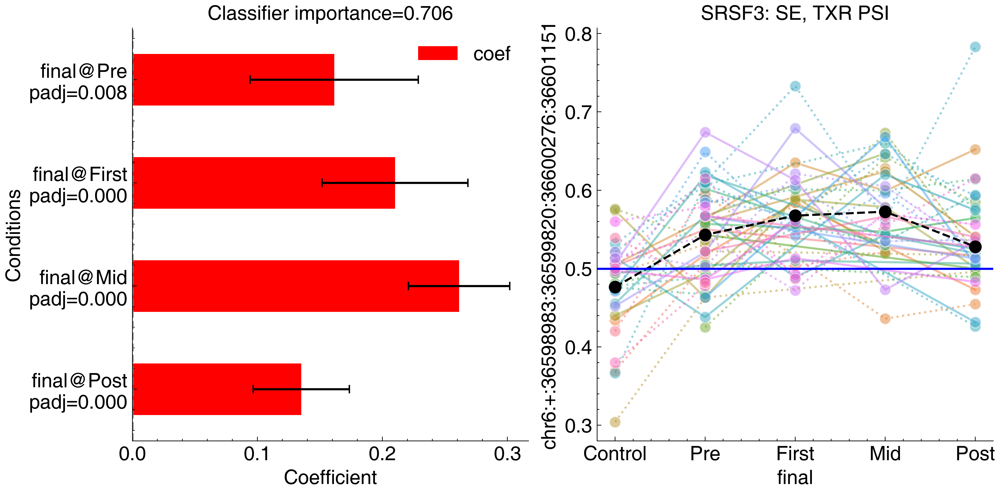

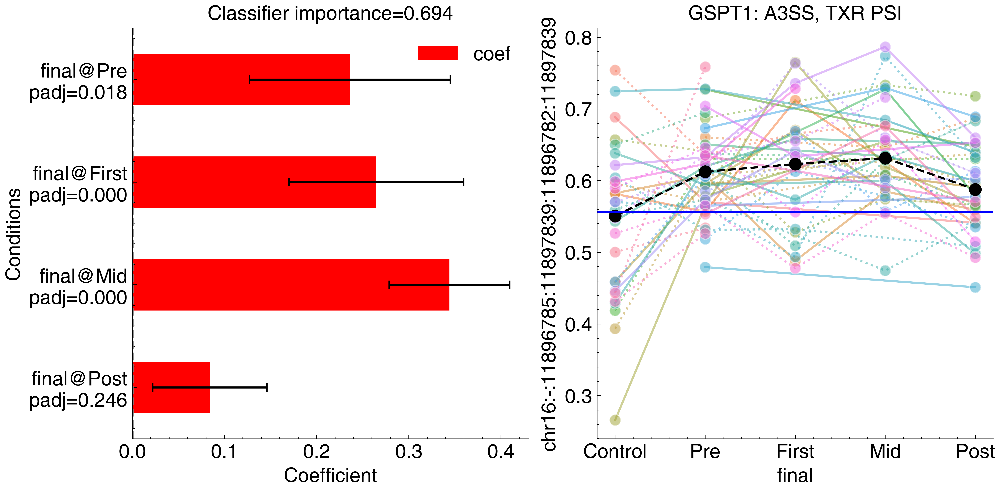

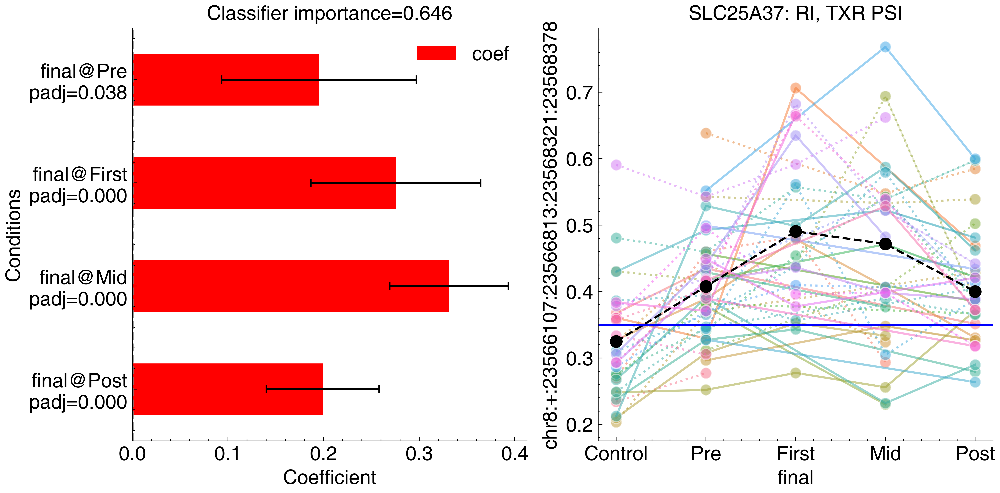

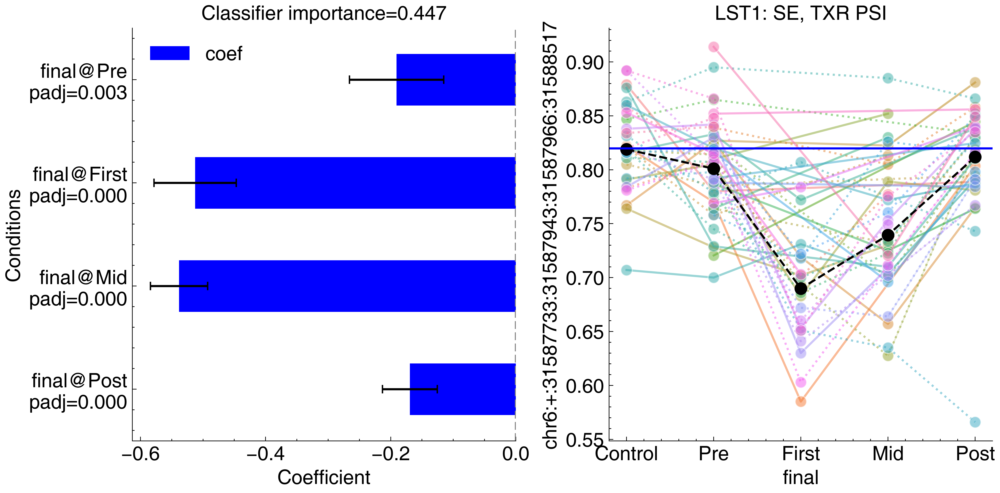

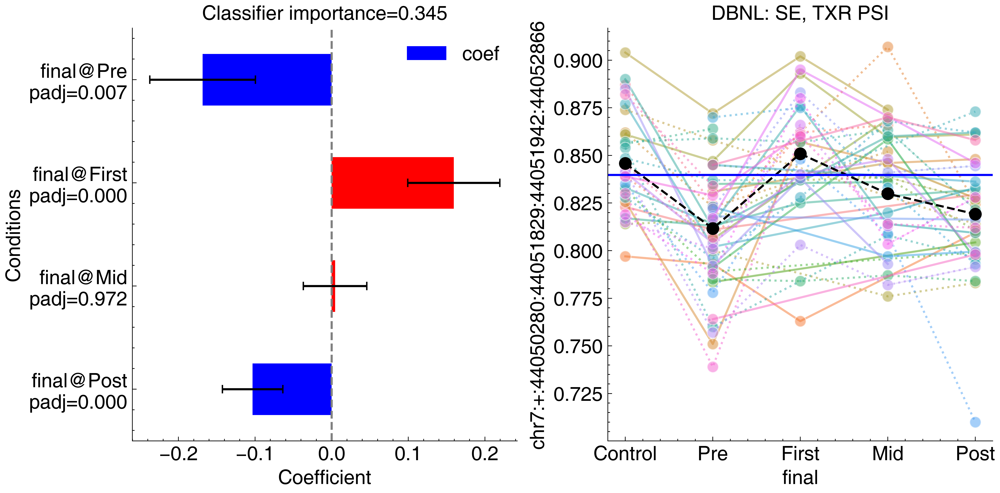

In [ ]:
final_to_num = {
    'Control': 0,
    'Pre': 1,
    'First': 2,
    'Mid': 3,
    'Post': 4,
}

for k in range(len(pre_first_consistent_eids)):
    # idx is the rank in candidate events
    idx = pre_first_consistent_eids[k]    
    cand_evt = candidate_events[idx]
    jmm = metaloader.data[candidate_events[idx][0]]
    eid = candidate_events[idx][2]
    coef_name = ':'.join([candidate_events[idx][_] for _ in [1,0,2]])
    coef_val = best_coefs_abs.loc[coef_name]
    if coef_val < 0.1:
        break
    
    # get Txr PSI
    psi_txr_df = jmm.transcript_measure.loc[[eid], pre_df['ID']].applymap(lambda x:x.psi)
    #print(candidate_events[i])
    #metaloader.data[candidate_events[i][0]].stats_tests[candidate_events[i][2]]

    # prepare plot df
    plot_txr_df = pre_df.join(psi_txr_df.transpose())
    plot_txr_df['final'].replace(final_to_num, inplace=True)
    # remove non-longitudinal samples
    plot_txr_df = plot_txr_df.loc[~plot_txr_df['final'].isin(['Late', 'False Negative', 'Immune'])]
    #plot_txr_df.groupby('final').mean()
    
    # 
    ctrl_samps = [x for x in jmm.sample_index 
              if x in jmm.covariates.meta.loc[jmm.covariates.meta['final']=='Control'].index.tolist()]
    get_tp_to_infect(plot_txr_df)
    
    fig, axs, genename = plot_pre_time_change(eid=eid, plot_txr_df=plot_txr_df)
    axs[0].set_title('Classifier importance=%.3f'%coef_val)
    fig.tight_layout()
    plt.savefig('%s/05-pre_first_consistent-%s.pdf'%(CLFDIR, genename))
    plt.show()

## Analyze/validate the subject with high Pre prediction

In [ ]:
pre_train_df[pre_train_df['first_clf_pred']>0.9]

In [ ]:
pre_train_df[pre_train_df['individual']=='P20_0246']

In [ ]:
indv_df = first_psi_df.loc[pre_train_df[pre_train_df['individual']=='P20_0246'].index,
                [train_stats[best_clf_id]['clf.coef'].abs().sort_values(ascending=False).index[idx] for idx in pre_first_consistent_eids]
                ][::-1].transpose()
indv_df

In [ ]:
print("FINISH:", datetime.now())